# Analysis of the GCR Communication Channel For Image Steganography


## Abstract
Main motivation behind this investigation is to determine how and to what extent Gray Component Removal (GCR) influence a color image. Specifically how GCR influence image in spatial domain, as well as in Fourier and Cosine domains. This is important to determine in order to develop a data hiding technique that can be used in GCR communication channel. To evaluate the influence of GCR on color image a large image dataset is first converted from RGB to CMYK color space with very aggressive GCR, then the original and the converted images are compared in Fourier and Cosine domains.

The results show that the GCR communication channel has nonlinear impact on the image that depends exclusively on the content of the image. The impact in spatial domain is too severe for watermarking techniques in spatial domain. In contrast, the extent of the impact in frequency domain is low enough so GCR can be used for data hiding techniques based on both, DFT and DCT transforms. 

In [2]:
# read the and GCR images
img_cmyk = fq.imread('cmykExample.tif')
img_gcr = fq.imread('gcrExample.tif')

With addition of the forth image component, neutral gray can be rendered using only K, or only C, M and Y, or any combination in between. Therefore by adding the forth image component, a redundancy is introduced, and this redundancy is at the center of every GCR algorithm, because it enables rendering of arbitrary color with large number of different possible C, M, Y, K combinations.The redundancy of the CMYK image is basis of GCR. Which is primarily used to reduce the Total Area Coverage - TAC of the image by replacing C, M and Y information with K. When done correctly the change is imperceivable to HVS. 

The images are in CMYK color space so to display them correctly we need to convert them to RGB. Here we are using ImageMagic convert using icc profiles.

In [3]:
!convert "cmykExample.tif" -profile Profiles/ISOcoated_v2_eci.icc -profile Profiles/sRGB2014.icc "rgbExample.tif"
!convert "gcrExample.tif" -profile Profiles/ISOcoated_v2_eci.icc -profile Profiles/sRGB2014.icc "rgbGCRExample.tif"

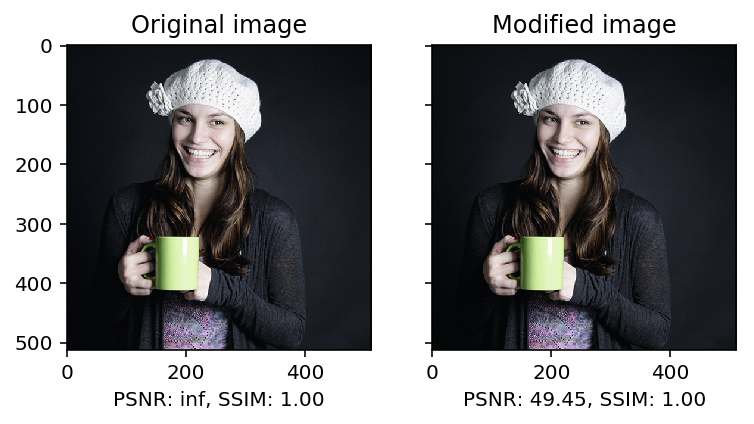

In [5]:
fq.compare_images(fq.imread('rgbExample.tif'), fq.imread('rgbGCRExample.tif'))

As it can be seen above the Original and Modified image are almost identical. Specifically note the SSIM metric which for modified image returns 1 even though the PSNR value is around 50 dB. However, in CMYK space, this images are very different.

Below is the comparison of the C,M,Y,K channels before and after GCR. When GCR is applied the area coverage of C, M, Y is reduced while area coverage of K is increased. TAC is decreased which means that the same image information can be rendered with less ink in total.

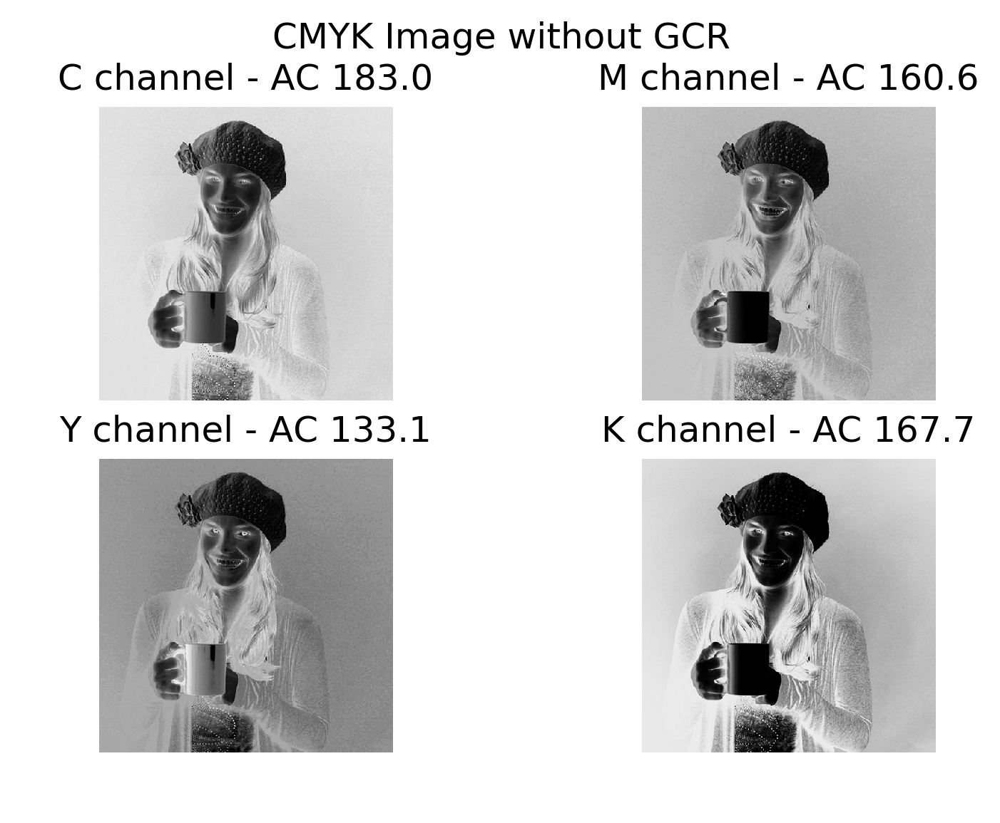

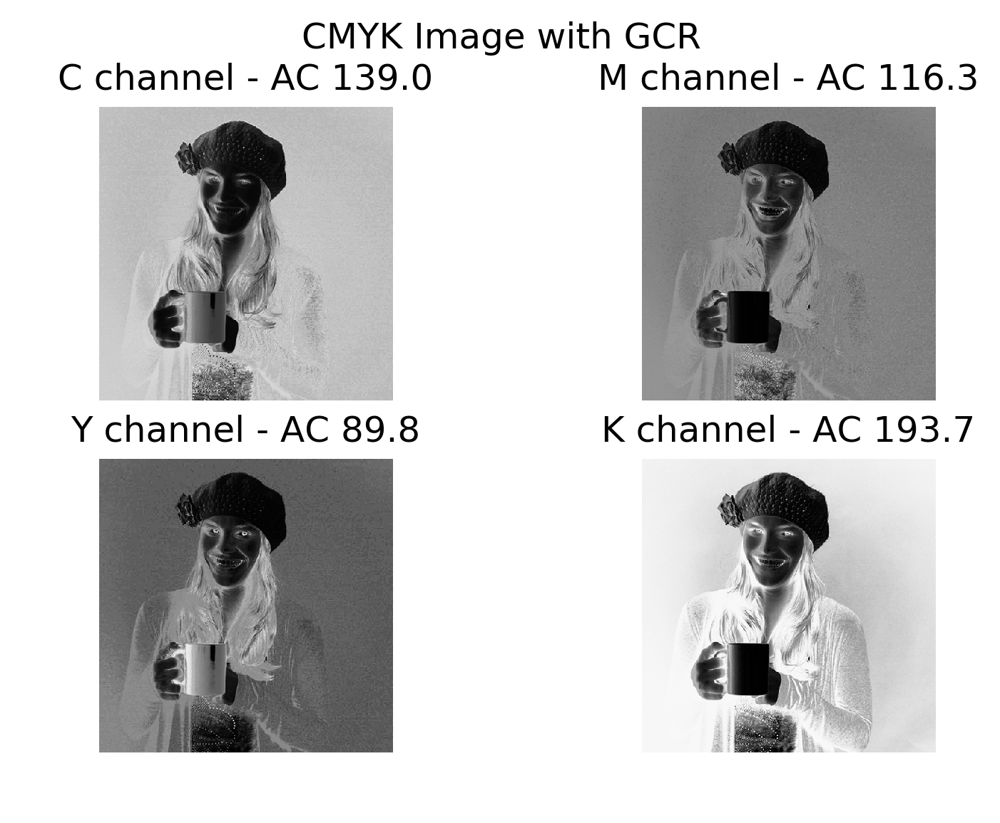

In [6]:
fq.imshow_components(img_cmyk, 'CMYK Image without GCR')
fq.imshow_components(img_gcr, 'CMYK Image with GCR')


In [42]:
#Check PSNR and SSIM of the modified image
print(f' CMYK = {np.mean(img_cmyk)}, GCR = {np.mean(img_gcr)}')
print(f' PSNR = {msr.compare_psnr(img_cmyk, img_gcr)},\
         SSIM = {msr.compare_ssim(img_cmyk, img_gcr,multichannel=True)}')

 CMYK = 161.09000396728516, GCR = 134.69199657440186
 PSNR = 15.574502361840041,         SSIM = 0.8640832769221374


In [41]:
#Check how many pixels didn't change.
diff = (img_cmyk) - (img_gcr)
diff_all=np.sum(diff,axis=2)#sum differences among channels
unique, counts = np.unique(diff_all, return_counts=True)
diff_all = dict(zip(unique, counts))
print(f' Number of unchanged prixels in in and image is {diff_all.get(0)}')

for channel in range(4):
    unique, counts = np.unique(diff[:,:,channel], return_counts=True)
    diff_channel = dict(zip(unique, counts))
    print(f' Number of unchanged prixels in channel({channel}) is {diff_channel.get(0)}')
    


 Number of unchanged prixels in in and image is 236
 Number of unchanged prixels in channel(0) is 2680
 Number of unchanged prixels in channel(1) is 1078
 Number of unchanged prixels in channel(2) is 1988
 Number of unchanged prixels in channel(3) is 1333


## Analysis of the impact on the DFT coefficients


### Analysis on an image

The impact of the GCR processing in the Fourier domain is determined by calculating the mean absolute difference: 
$$G_{xy}={|F_{xy}-\hat{F}_{xy}|}$$

The difference is then averaged across the entire image test set for both, magnitude and phase spectra of the image. 
$$\bar{G}_{xy}=\frac {1}{n}\sum_{i=1}^{n}{|F_{xy}^i-\hat{F}_{xy}^i|}$$

The mean of magnitude coefficients is shown bellow. Note that the $\log$ scale was used since the difference for low-frequency coefficients is few orders of magnitude higher than for high-frequency coefficients. Visualized difference clearly shows that GCR strongly impacts low-frequency coefficients, while medium and high-frequency coefficients are much less changed (this observance is consistent for all four color channels). Note that this is in line with state of the art watermarking methods based on Fourier domain which avoid embedding secret payload in low-frequency to reduce the impact on the quality of a host image.

In [58]:
# original cmyk image 
mag_img_c, pha_img_c = fq.spatial2dft(img_cmyk[:,:,0]) 
mag_img_m, pha_img_m = fq.spatial2dft(img_cmyk[:,:,1])
mag_img_y, pha_img_y = fq.spatial2dft(img_cmyk[:,:,2])
mag_img_k, pha_img_k = fq.spatial2dft(img_cmyk[:,:,3])

#gcr image
mag_img_gcr_c, pha_img_gcr_c = fq.spatial2dft(img_gcr[:,:,0]) 
mag_img_gcr_m, pha_img_gcr_m = fq.spatial2dft(img_gcr[:,:,1])
mag_img_gcr_y, pha_img_gcr_y = fq.spatial2dft(img_gcr[:,:,2])
mag_img_gcr_k, pha_img_gcr_k = fq.spatial2dft(img_gcr[:,:,3])

#differences in magnitude spectrum
diff_mag_c = np.abs(mag_img_c - mag_img_gcr_c)
diff_mag_m = np.abs(mag_img_m - mag_img_gcr_m)
diff_mag_y = np.abs(mag_img_y - mag_img_gcr_y)
diff_mag_k = np.abs(mag_img_k - mag_img_gcr_k)

#differences in phase spectrum
diff_pha_c = np.abs(pha_img_c - pha_img_gcr_c)
diff_pha_m = np.abs(pha_img_m - pha_img_gcr_m)
diff_pha_y = np.abs(pha_img_y - pha_img_gcr_y)
diff_pha_k = np.abs(pha_img_k - pha_img_gcr_k)


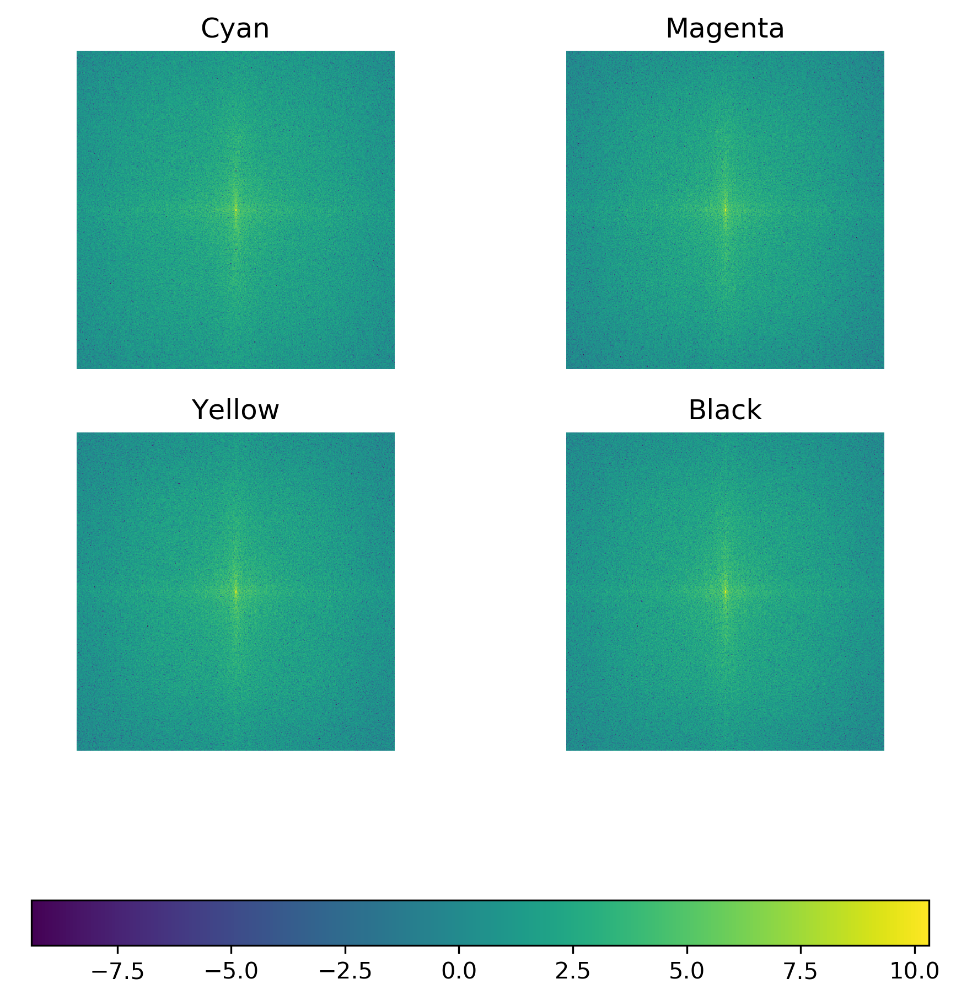

In [59]:
#compare magnitude spectrum of an example image
fq.imshow_four(np.log(diff_mag_c),np.log(diff_mag_m),np.log(diff_mag_y),np.log(diff_mag_y))

Difference of the phase coefficients of the example image is shown bellow. The resulting impact on phase spectrum is analog to impact on magnitude spectrum i.e. the difference is stronger in lower frequencies, while medium and high frequencies are less affected. Also, there is no obvious difference among different color channels.

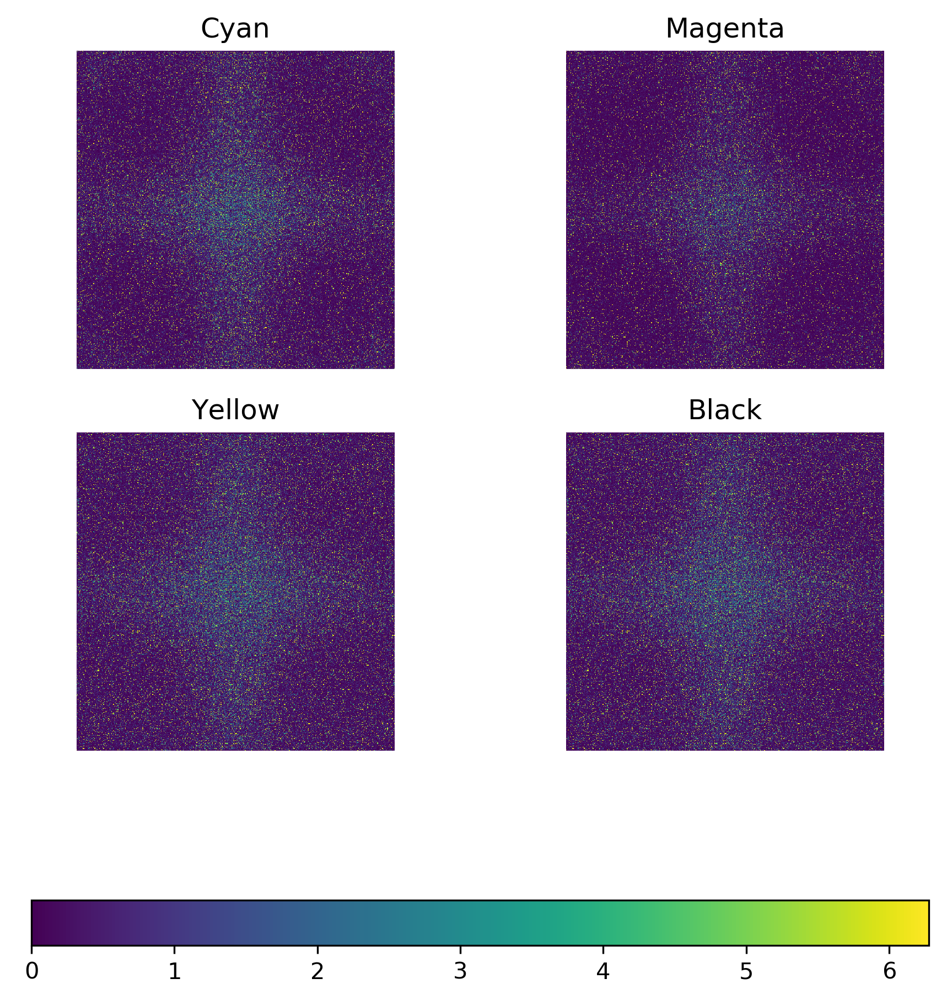

In [64]:
#compare phase spectrum of an example image
fq.imshow_four(diff_pha_c,diff_pha_m,diff_pha_y,diff_pha_y)

## Analysis of the impact on the DCT coefficients
### Impact on the DFT coefficients of separate channels
Impact of the GCR communication channel on Cosine domain is evaluated the same way as the impact of Fourier domain, except the comparison was made block-wise with block size of $8 \times 8$ pixels.

#### Blockwise difference for single block of the image
DCT is widly used in image compression algorithms. It is usually applied blockwise where the size of the block depends on the algorithm (8 x 8 for JPEG ). Therefore blockwise analysis of the impact of GCR can give good insight when evaluating possible JPEG optimized watermarking techniques.

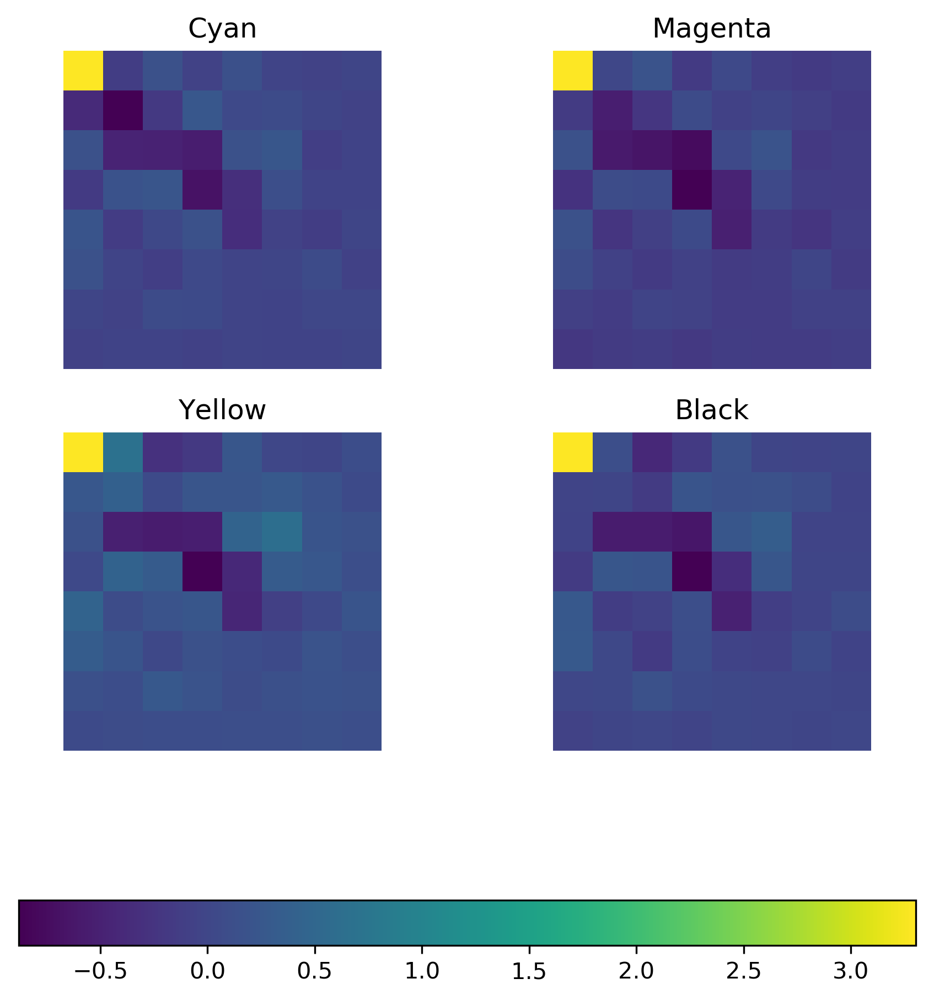

In [69]:
# original cmyk image 
dct_img_c = fq.spatial2dct(img_cmyk[0:8,0:8,0]) 
dct_img_m = fq.spatial2dct(img_cmyk[0:8,0:8,1])
dct_img_y = fq.spatial2dct(img_cmyk[0:8,0:8,2])
dct_img_k = fq.spatial2dct(img_cmyk[0:8,0:8,3])

#gcr image
dct_img_gcr_c = fq.spatial2dct(img_gcr[0:8,0:8,0]) 
dct_img_gcr_m = fq.spatial2dct(img_gcr[0:8,0:8,1])
dct_img_gcr_y = fq.spatial2dct(img_gcr[0:8,0:8,2])
dct_img_gcr_k = fq.spatial2dct(img_gcr[0:8,0:8,3])
fq.imshow_four(dct_img_gcr_c,dct_img_gcr_m,dct_img_gcr_y,dct_img_gcr_k)

## Analysis on a test set

### Spatial Domain

In [87]:
# method for parsing all files in a directory
def getFiles(path, ext):
    dir_path = Path(path)
    return [pth for pth in dir_path.iterdir()
           if pth.suffix == ext]

# test directory
test_pth_cmyk = Path('TestImages/TestSet').resolve()
test_pth_gcr = Path('TestImages/TestSet_GCR').resolve()

img_pths_cmyk = getFiles(test_pth_cmyk,'.tif')
img_pths_gcr = getFiles(test_pth_gcr,'.tif')

#sort lists
img_pths_cmyk = sorted(img_pths_cmyk)
img_pths_gcr = sorted(img_pths_gcr)
numImgs=len(img_pths_cmyk) # total number of images

In [88]:
#numpy array to hold our data
diff = np.zeros((len(img_pths_cmyk),15))

for i in range(len(img_pths_cmyk)):
    img_cmyk = imageio.imread(img_pths_cmyk[i].as_uri())
    img_gcr = imageio.imread(img_pths_gcr[i].as_uri())
    diff[i,0]=msr.compare_psnr(img_cmyk,img_gcr)
    diff[i,1]=msr.compare_ssim(img_cmyk,img_gcr,multichannel=True)
    diff[i,2]=fq.abs_diff(img_cmyk,img_gcr)
    for k in range(4):
        diff[i,(3*k)+3] = msr.compare_psnr(img_cmyk[:,:,k],img_gcr[:,:,k])
        diff[i,(3*k)+4] = msr.compare_ssim(img_cmyk[:,:,k],img_gcr[:,:,k], multichannel=True)
        diff[i,(3*k)+5] = fq.abs_diff(img_cmyk[:,:,k],img_gcr[:,:,k])
measures = pd.DataFrame(diff,columns=['psnr', 'ssim', 'abs diff',
                                     'C psnr', 'C ssim', 'C abs diff',
                                     'M psnr', 'M ssim', 'M abs diff',
                                     'Y psnr', 'Y ssim', 'Y abs diff',
                                     'K psnr', 'K ssim', 'K abs diff'])   

In [89]:
measures.describe().round(2)

,psnr,ssim,abs diff,C psnr,C ssim,C abs diff,M psnr,M ssim,M abs diff,Y psnr,Y ssim,Y abs diff,K psnr,K ssim,K abs diff
count,10.00,10.00,10.00,10.00,10.00,10.00,10.00,10.00,10.00,10.00,10.00,10.00,10.00,10.00,10.00
mean,18.18,0.83,0.11,17.06,0.80,0.13,18.37,0.86,0.10,18.87,0.85,0.10,19.22,0.81,0.10
std,1.72,0.03,0.03,1.90,0.05,0.03,1.84,0.04,0.03,2.13,0.06,0.03,2.42,0.08,0.03
min,15.57,0.77,0.07,14.87,0.72,0.06,14.65,0.79,0.07,14.92,0.73,0.06,15.28,0.71,0.05
25%,16.83,0.81,0.08,15.72,0.75,0.11,17.46,0.86,0.08,17.78,0.81,0.07,17.55,0.75,0.08
50%,17.92,0.83,0.11,16.61,0.79,0.13,18.49,0.87,0.10,18.19,0.84,0.11,19.50,0.78,0.10
75%,19.67,0.85,0.13,17.75,0.84,0.15,19.72,0.89,0.11,20.81,0.89,0.12,20.72,0.89,0.12
max,20.48,0.87,0.15,21.39,0.87,0.17,20.66,0.92,0.17,21.87,0.94,0.17,22.88,0.93,0.15


In [40]:
# with open('table.tex', 'w') as tf:
#      tf.write(measures.describe().round(2).to_latex())


In [74]:
### Fourier Domain

In [71]:
mag_all_block_k = np.zeros((512,512,numImgs))
mag_all_block_c = np.zeros((512,512,numImgs))
mag_all_block_m = np.zeros((512,512,numImgs))
mag_all_block_y = np.zeros((512,512,numImgs))

pha_all_block_k = np.zeros((512,512,numImgs))
pha_all_block_c = np.zeros((512,512,numImgs))
pha_all_block_m = np.zeros((512,512,numImgs))
pha_all_block_y = np.zeros((512,512,numImgs))

for i in range(numImgs):#len(img_pths_cmyk)):
    # read images
    img_cmyk = imageio.imread(img_pths_cmyk[i].as_uri())
    # img_cmyk = imageio.imread('/home/call1st0/Dropbox/Radovi/Elmar2019/freqdomain/lena512cmyk.tif')
    img_gcr = imageio.imread(img_pths_gcr[i].as_uri())
    # img_gcr = imageio.imread('/home/call1st0/Dropbox/Radovi/Elmar2019/freqdomain/gcrlena512cmyk.tif')

    # Calculate dct blockwise for the C channel
    mag_all_c, pha_all_c = fq.spatial2dft(img_cmyk[:,:,0])
    mag_all_gcr_c, pha_all_gcr_c = fq.spatial2dft(img_gcr[:,:,0])

    # Calculate differance between the images.
    mag_all_block_c[:,:,i] = np.abs(mag_all_c - mag_all_gcr_c)
    pha_all_block_c[:,:,i] = np.abs(pha_all_c - pha_all_gcr_c)

    # Calculate dct blockwise for the k channel
    mag_all_m, pha_all_m = fq.spatial2dft(img_cmyk[:,:,1])
    mag_all_gcr_m, pha_all_gcr_m = fq.spatial2dft(img_gcr[:,:,1])

    # Calculate differance between the images.
    mag_all_block_m[:,:,i] = np.abs(mag_all_m - mag_all_gcr_m)
    pha_all_block_m[:,:,i] = np.abs(pha_all_m - pha_all_gcr_m)

    # Calculate dct blockwise for the k channel
    mag_all_y, pha_all_y = fq.spatial2dft(img_cmyk[:,:,2])
    mag_all_gcr_y, pha_all_gcr_y = fq.spatial2dft(img_gcr[:,:,2])

    # Calculate differance between the images.
    mag_all_block_y[:,:,i] = np.abs(mag_all_y - mag_all_gcr_y)
    pha_all_block_y[:,:,i] = np.abs(pha_all_y - pha_all_gcr_y)

    # Calculate dct blockwise for the k channel
    mag_all_k, pha_all_k = fq.spatial2dft(img_cmyk[:,:,3])
    mag_all_gcr_k, pha_all_gcr_k = fq.spatial2dft(img_gcr[:,:,3])

    # Calculate differance between the images.
    mag_all_block_k[:,:,i] = np.abs(mag_all_k - mag_all_gcr_k)
    pha_all_block_k[:,:,i] = np.abs(pha_all_k - pha_all_gcr_k)

mag_all_avg_k = np.log10(np.mean(mag_all_block_k,axis=2))
mag_all_avg_c = np.log10(np.mean(mag_all_block_c,axis=2))
mag_all_avg_m = np.log10(np.mean(mag_all_block_m,axis=2))
mag_all_avg_y = np.log10(np.mean(mag_all_block_y,axis=2))

pha_all_avg_k = np.mean(pha_all_block_k,axis=2)
pha_all_avg_c = np.mean(pha_all_block_c,axis=2)
pha_all_avg_m = np.mean(pha_all_block_m,axis=2)
pha_all_avg_y = np.mean(pha_all_block_y,axis=2)



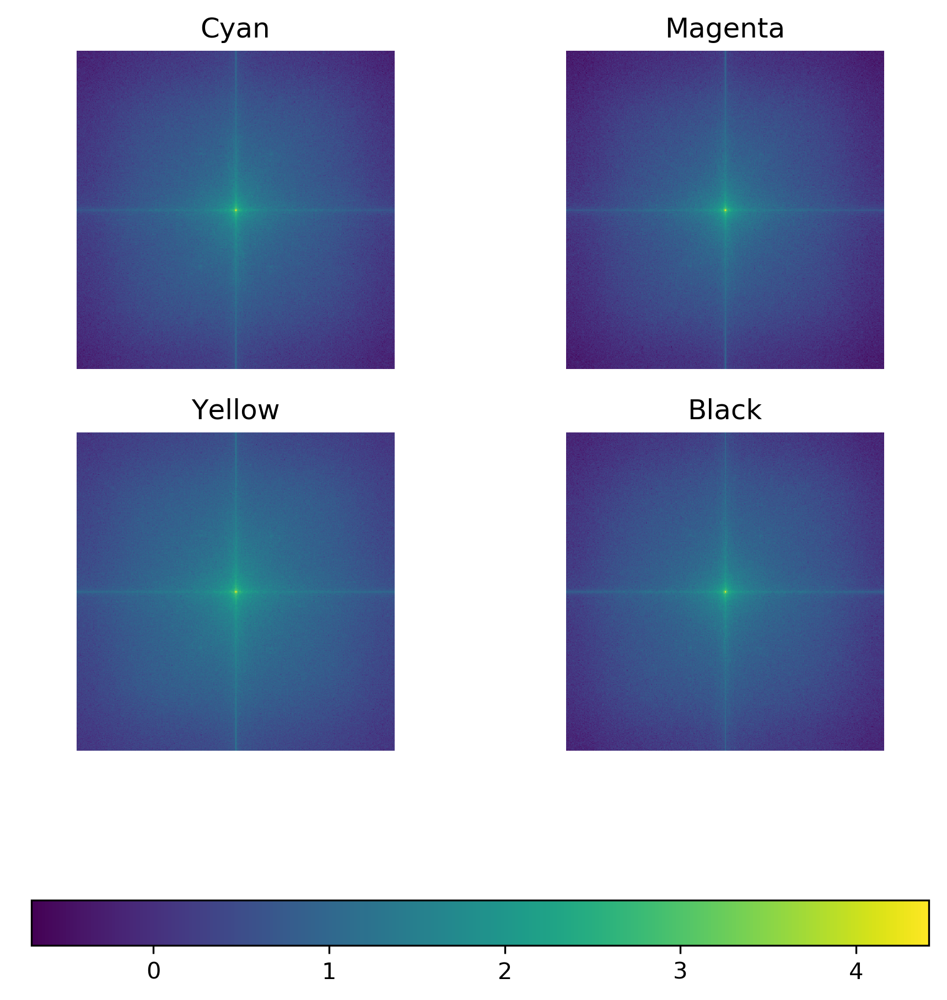

In [72]:
#%matplotlib qt
#plt.rcParams.update({'font.size': 5})
fq.imshow_four(mag_all_avg_c,mag_all_avg_m,mag_all_avg_y,mag_all_avg_k)

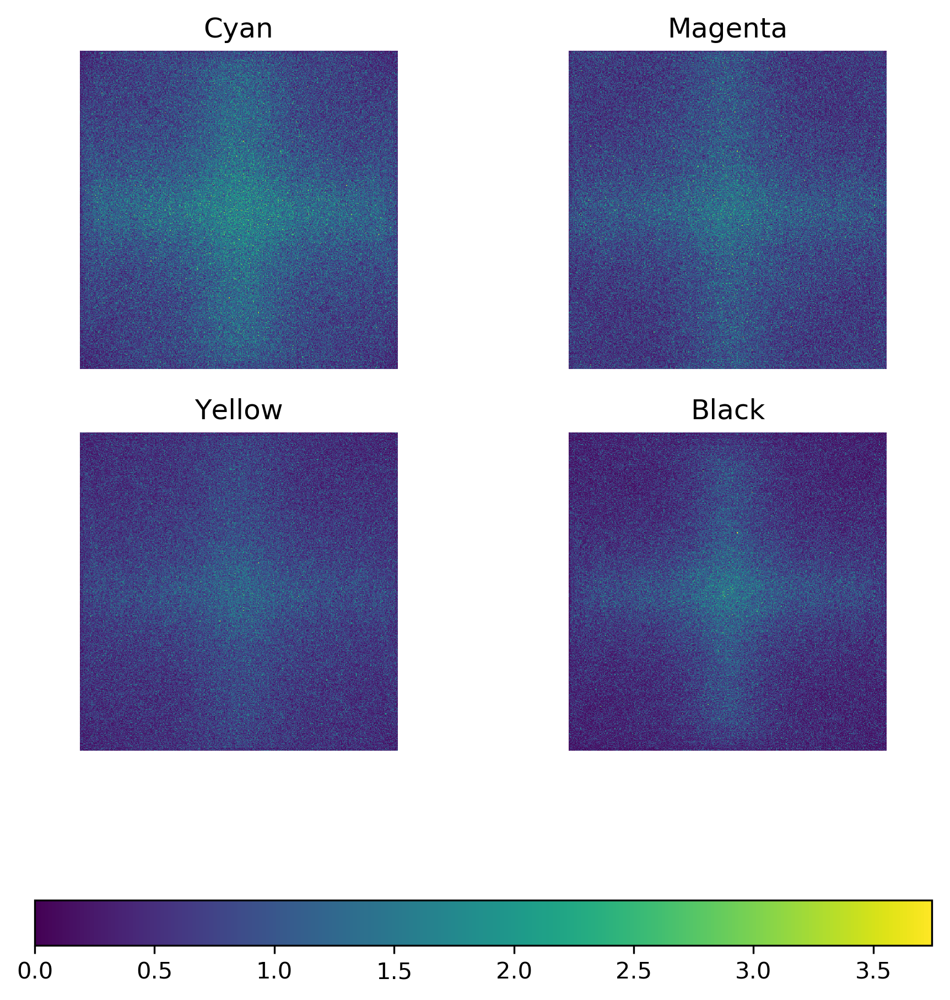

In [73]:
# %matplotlib qt
# plt.rcParams.update({'font.size': 5})
fq.imshow_four(pha_all_avg_c,pha_all_avg_m,pha_all_avg_y,pha_all_avg_k)

In [75]:
### Cosine domain

In [79]:
dct_all_block_k = np.zeros((8,8,numImgs))
dct_all_block_c = np.zeros((8,8,numImgs))
dct_all_block_m = np.zeros((8,8,numImgs))
dct_all_block_y = np.zeros((8,8,numImgs))

for i in range(numImgs):#len(img_pths_cmyk)):
    # read images
    img_cmyk = imageio.imread(img_pths_cmyk[i].as_uri())
    # img_cmyk = imageio.imread('/home/call1st0/Dropbox/Radovi/Elmar2019/freqdomain/lena512cmyk.tif')
    img_gcr = imageio.imread(img_pths_gcr[i].as_uri())
    # img_gcr = imageio.imread('/home/call1st0/Dropbox/Radovi/Elmar2019/freqdomain/gcrlena512cmyk.tif')

    # Calculate dct blockwise for the C channel
    dct_all_c = fq.block_process(img_cmyk[:,:,0],8,fq.spatial2dct)
    dct_all_gcr_c = fq.block_process(img_gcr[:,:,0],8,fq.spatial2dct)

    # Calculate differance between the blocks and determine average.
    dct_all_block_c[:,:,i] = fq.block_average(dct_all_c,dct_all_gcr_c,8)

    # Calculate dct blockwise for the M channel
    dct_all_m = fq.block_process(img_cmyk[:,:,1],8,fq.spatial2dct)
    dct_all_gcr_m = fq.block_process(img_gcr[:,:,1],8,fq.spatial2dct)

    # Calculate differance between the blocks and determine average. Then plot the results
    dct_all_block_m[:,:,i] = fq.block_average(dct_all_m,dct_all_gcr_m,8)

    # Calculate dct blockwise for the Y channel
    dct_all_y = fq.block_process(img_cmyk[:,:,2],8,fq.spatial2dct)
    dct_all_gcr_y = fq.block_process(img_gcr[:,:,2],8,fq.spatial2dct)

    # Calculate differance between the blocks and determine average.
    dct_all_block_y[:,:,i] = fq.block_average(dct_all_y,dct_all_gcr_y,8)

    # Calculate dct blockwise for the K channel
    dct_all_k = fq.block_process(img_cmyk[:,:,3],8,fq.spatial2dct)
    dct_all_gcr_k = fq.block_process(img_gcr[:,:,3],8,fq.spatial2dct)

    # Calculate differance between the blocks and determine average. 
    dct_all_block_k[:,:,i] = fq.block_average(dct_all_k,dct_all_gcr_k,8)

dct_all_avg_k = np.mean(dct_all_block_k,axis=2)
dct_all_avg_c = np.mean(dct_all_block_c,axis=2)
dct_all_avg_m = np.mean(dct_all_block_m,axis=2)
dct_all_avg_y = np.mean(dct_all_block_y,axis=2)

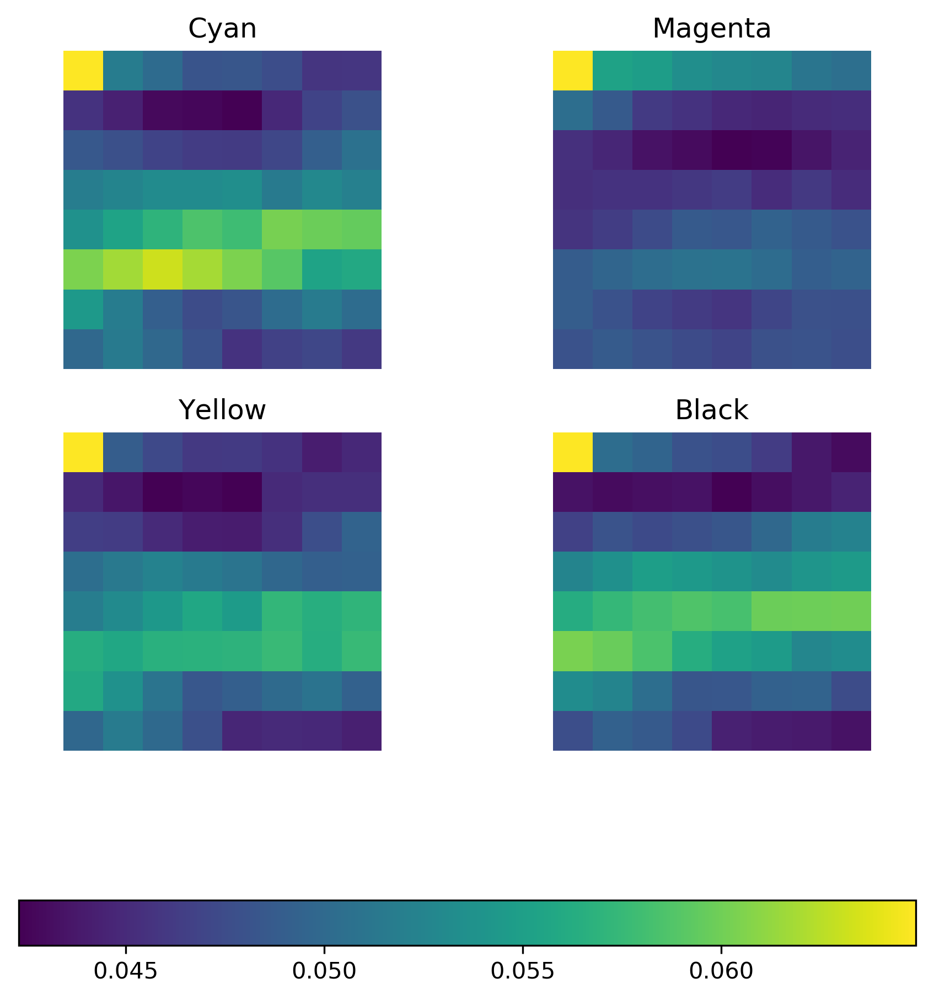

In [80]:
#%matplotlib qt
#plt.rcParams.update({'font.size': 5})
fq.imshow_four(dct_all_avg_k,dct_all_avg_c,dct_all_avg_m,dct_all_avg_y)

## Conclusion
From this investigation following conclusions can be drawn. Spatial domain based steganography methods could also be used but only if the data hiding algorithm has a priori knowledge of the GCR method to carefully chose the potential pixels as candidates for implementation of the hidden information. However, this also means that the capacity of these methods will have to be much smaller and will be image dependant.

Fourier domain based steganography methods can be freely used within GCR communication channel if low-frequency coefficients in both, phase and magnitude spectrum are avoided. The same holds for Cosine domain where most of coefficients are changed only slightly and only DC component should be avoided when secret payload is embedded.